In [ ]:
# Importing the drive module from google.colab library
from google.colab import drive

# Mounting the Google Drive to the Colab environment
drive.mount('/content/drive')

project_path = '/content/drive/My Drive/MSc_Thesis/'

import os
os.chdir(project_path)

Mounted at /content/drive


In [ ]:
import numpy as np
import tensorflow as tf
from utils.helpers_functions import denormalize_mae, read_dataset,mean_with_land_mask, mean_with_coastline_mask, interpolation, reshape, z_score_normalize
from utils.display_functions import plot_to_compare, plot_history, plot_per_pixel_metrics, plot_degrees_mae, plot_mask_grid
from utils.models_functions import psnr, ssim, load_model
from utils.evaluation_functions import baseline_evaluate_per_pixel, evaluate_per_pixel, overall_evaluate_per_pixel

dates_path='input_data/index/'
lr_data_path='input_data/deg/1x1/'
mr_data_path='input_data/deg/0_5x0_5/'
hr_data_path='input_data/deg/0_25x0_25/'
global_mean = 286.307980744908
global_Std = 64.2568020375484

In [ ]:
_, _, testX, _, _, testY, _, _, testDates = read_dataset(project_path, dates_path, lr_data_path, hr_data_path, \
                                                                    'all', 2000, 2020, global_mean, global_Std)

# **Baseline**

In [ ]:
upsampled_data = []
for img in testX:
    upsampled_img = interpolation(np.squeeze(img), (320, 580))
    upsampled_data.append(upsampled_img)

hr_data_bicubic = np.array(upsampled_data)
hr_data_bicubic =reshape(hr_data_bicubic)

In [ ]:
bicubic_test_mse, bicubic_test_mae, bicubic_test_psnr, bicubic_test_ssim = baseline_evaluate_per_pixel(hr_data_bicubic, testY, max_pixel=1.0)

In [ ]:
print("Per-pixel MSE shape:", bicubic_test_mse.shape)
print("Per-pixel MAE shape:", bicubic_test_mae.shape)
print("Per-pixel PSNR shape:", bicubic_test_psnr.shape)
print("Per-pixel SSIM shape:", bicubic_test_ssim.shape)

bicubic_mean_mse = np.mean(bicubic_test_mse)
bicubic_mean_mae = np.mean(bicubic_test_mae)
bicubic_mean_psnr = np.mean(bicubic_test_psnr)
bicubic_mean_ssim = np.mean(bicubic_test_ssim)

print("Mean Per-Pixel MSE:", bicubic_mean_mse)
print("Mean Per-Pixel MAE:", bicubic_mean_mae)
print("Mean Per-Pixel PSNR:", bicubic_mean_psnr)
print("Mean Per-Pixel SSIM:", bicubic_mean_ssim)

Per-pixel MSE shape: (320, 580, 1)
Per-pixel MAE shape: (320, 580, 1)
Per-pixel PSNR shape: (320, 580, 1)
Per-pixel SSIM shape: (320, 580, 1)
Mean Per-Pixel MSE: 0.00016450239584827025
Mean Per-Pixel MAE: 0.006072624870891618
Mean Per-Pixel PSNR: 46.659295854460574
Mean Per-Pixel SSIM: 0.9821501926088599


In [ ]:
# Baseline results
b_mse = bicubic_test_mse.reshape(-1)
b_mae = bicubic_test_mae.reshape(-1)
b_psnr = bicubic_test_psnr.reshape(-1)
b_ssim = bicubic_test_ssim.reshape(-1)


Mean Per-Pixel Degrees MAE: 0.39020745417717556
Max Degrees MAE: 12.991224134401165
Min Degrees MAE: 0.019688422719924385


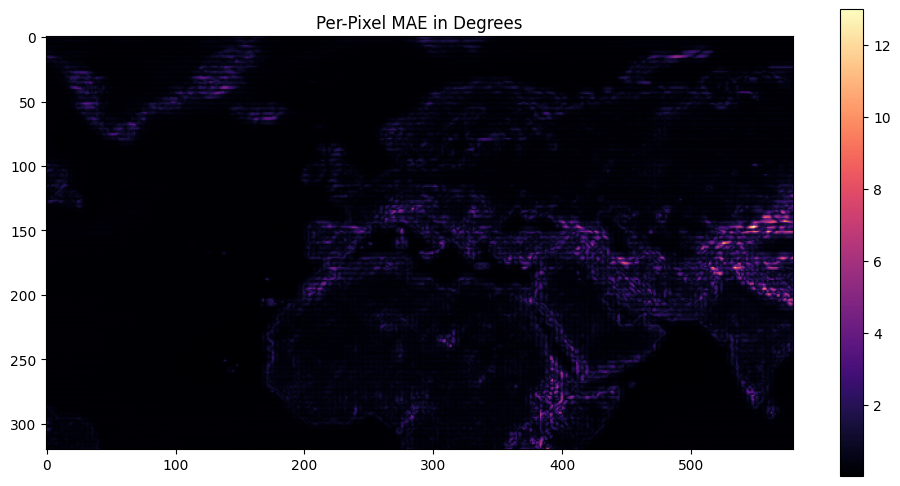

In [ ]:
bicubic_degrees_mae = denormalize_mae(bicubic_test_mae, global_Std)
print("Mean Per-Pixel Degrees MAE:", np.mean(bicubic_degrees_mae))
print("Max Degrees MAE:", bicubic_degrees_mae.max())
print("Min Degrees MAE:", bicubic_degrees_mae.min())
plot_degrees_mae(bicubic_degrees_mae)

# **Simple EDSR**

In [ ]:
edsr_model_step1 = tf.keras.models.load_model('models/edsr_model_1to0_5_deg_all.keras', custom_objects={'psnr': psnr, 'ssim': ssim}, safe_mode=False)
edsr_model_step2 = tf.keras.models.load_model('models/edsr_model_0_5to0_25_deg_all.keras', custom_objects={'psnr': psnr, 'ssim': ssim}, safe_mode=False)

In [ ]:
medium_res_output = edsr_model_step1.predict(testX)
# pred_high_res = edsr_model_step2.predict(medium_res_output)
test_loss, test_psnr, test_ssim, test_mse, test_mae = edsr_model_step2.evaluate(medium_res_output, testY)

print(f"Test Loss: {test_loss}")
print(f"Test PSNR: {test_psnr}")
print(f"Test SSIM: {test_ssim}")
print(f"Test MSE: {test_mse}")
print(f"Test MAE: {test_mae}")

144/144 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
144/144 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.0043 - mae: 0.0043 - mse: 6.5445e-05 - psnr: 41.8448 - ssim: 0.9720
Test Loss: 0.004307134076952934
Test PSNR: 41.842472076416016
Test SSIM: 0.9720607399940491
Test MSE: 6.548107921844348e-05
Test MAE: 0.004307134076952934


In [ ]:
test_mse, test_mae, test_psnr, test_ssim = overall_evaluate_per_pixel(edsr_model_step1, edsr_model_step2, testX, testY)

print(test_mse.shape)
print(test_mae.shape)
print(test_psnr.shape)
print(test_ssim.shape)

mean_mse = np.mean(test_mse)
mean_mae = np.mean(test_mae)
mean_psnr = np.mean(test_psnr)
mean_ssim = np.mean(test_ssim)

print("Mean Per-Pixel MSE:", mean_mse)
print("Mean Per-Pixel MAE:", mean_mae)
print("Mean Per-Pixel PSNR:", mean_psnr)
print("Mean Per-Pixel SSIM:", mean_ssim)

144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
144/144 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step
(320, 580, 1)
(320, 580, 1)
(320, 580, 1)
(320, 580, 1)
Mean Per-Pixel MSE: 6.548109e-05
Mean Per-Pixel MAE: 0.0043071336
Mean Per-Pixel PSNR: 47.772705
Mean Per-Pixel SSIM: 0.992537


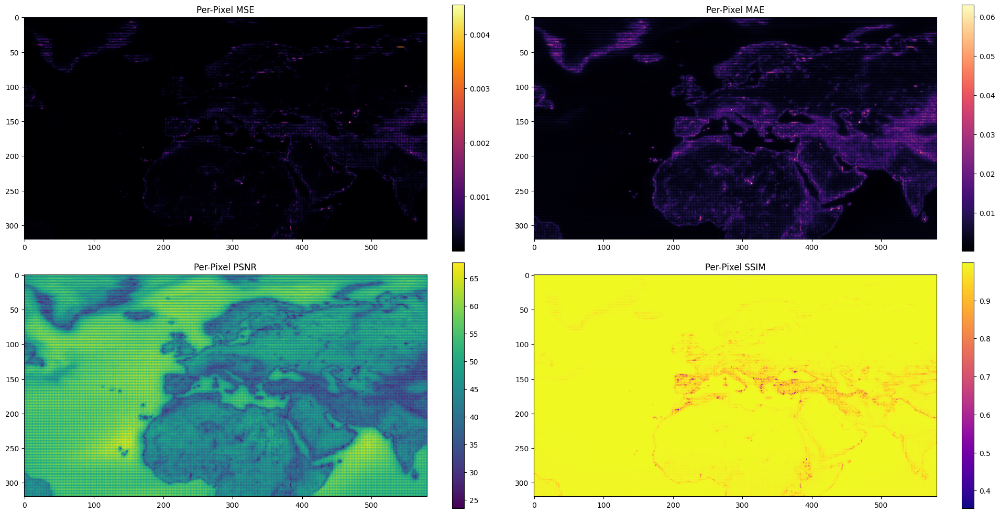

In [ ]:
# Plot results
plot_per_pixel_metrics(test_mse, test_mae, test_psnr, test_ssim)

In [ ]:
# Model 1 results
m1_mse = test_mse.reshape(-1)
m1_mae = test_mae.reshape(-1)
m1_psnr = test_psnr.reshape(-1)
m1_ssim = test_ssim.reshape(-1)


Mean Per-Pixel Degrees MAE: 0.27676263
Max Degrees MAE: 4.044302
Min Degrees MAE: 0.017998211


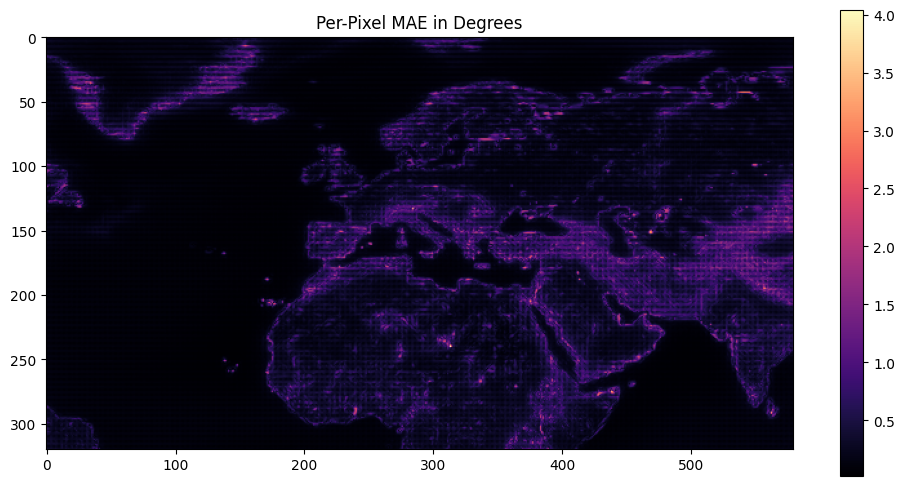

In [ ]:
degrees_mae_2steps = denormalize_mae(test_mae, global_Std)
print("Mean Per-Pixel Degrees MAE:", np.mean(degrees_mae_2steps))
print("Max Degrees MAE:", degrees_mae_2steps.max())
print("Min Degrees MAE:", degrees_mae_2steps.min())
plot_degrees_mae(degrees_mae_2steps)

In [ ]:
print("Mean Land-Pixels Degrees MAE:", mean_with_land_mask(degrees_mae_2steps, '0_25'))
print("Mean Land-Pixels MAE:", mean_with_land_mask(test_mae, '0_25'))

Mean Land-Pixels Degrees MAE: 0.41915902
Mean Land-Pixels MAE: 0.0065231845


In [ ]:
print("Mean Coastline-Pixels Degrees MAE:", mean_with_coastline_mask(degrees_mae_2steps, '0_25'))
print("Mean Costline-Pixels MAE:", mean_with_coastline_mask(test_mae, '0_25'))

Mean Coastline-Pixels Degrees MAE: 0.6341426
Mean Costline-Pixels MAE: 0.009868878


# **DEM EDSR**

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Add, LeakyReLU, Lambda, Conv2DTranspose, UpSampling2D, Concatenate
from tensorflow.keras.models import Model

dem_data_1 = np.load("luse_and_dem/dem_1.npy")
dem_data_1 = z_score_normalize(dem_data_1, np.mean(dem_data_1), np.var(dem_data_1))

# Convert to TensorFlow Constants
dem_tensor_1 = tf.constant(dem_data_1, dtype=tf.float32)
dem_tensor_1 = tf.expand_dims(dem_tensor_1, axis=-1)

def expand_static_data_dem_1(x):
    batch_size = tf.shape(x)[0]
    return tf.tile(tf.expand_dims(dem_tensor_1, 0), [batch_size, 1, 1, 1])

dem_data_0_5 = np.load("luse_and_dem/dem_0_5.npy")
dem_data_0_5 = z_score_normalize(dem_data_0_5, np.mean(dem_data_0_5), np.var(dem_data_0_5))

# Convert to TensorFlow Constants
dem_tensor_0_5 = tf.constant(dem_data_0_5, dtype=tf.float32)
dem_tensor_0_5 = tf.expand_dims(dem_tensor_0_5, axis=-1)

def expand_static_data_dem_0_5(x):
    batch_size = tf.shape(x)[0]
    return tf.tile(tf.expand_dims(dem_tensor_0_5, 0), [batch_size, 1, 1, 1])

# Residual Block (Keeping Filters Constant)
def residual_block(x, filters=32, kernel_size=3, scaling=0.1):
    res = Conv2D(filters, kernel_size, padding='same')(x)
    res = LeakyReLU(alpha=0.2)(res)
    res = Conv2D(filters, kernel_size, padding='same')(res)
    res = Lambda(lambda t: t * scaling)(res)  # Scale residual output
    return Add()([x, res])  # Skip connection within residual block

dem_edsr_model_step1 = tf.keras.models.load_model('models/edsr_model_1to0_5_deg_dem.keras', custom_objects={
    'psnr': psnr,
    'ssim': ssim,
    'residual_block': residual_block,
    'expand_static_data_dem_1': expand_static_data_dem_1,
    'expand_static_data_dem_0_5': expand_static_data_dem_0_5
}, safe_mode=False)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Add, LeakyReLU, Lambda, Conv2DTranspose, UpSampling2D, Concatenate
from tensorflow.keras.models import Model

dem_data_0_5 = np.load("luse_and_dem/dem_0_5.npy")
dem_data_0_5 = z_score_normalize(dem_data_0_5, np.mean(dem_data_0_5), np.var(dem_data_0_5))

# Convert to TensorFlow Constants
dem_tensor_0_5 = tf.constant(dem_data_0_5, dtype=tf.float32)
dem_tensor_0_5 = tf.expand_dims(dem_tensor_0_5, axis=-1)

def expand_static_data_dem_0_5(x):
    batch_size = tf.shape(x)[0]
    return tf.tile(tf.expand_dims(dem_tensor_0_5, 0), [batch_size, 1, 1, 1])

dem_data_0_25 = np.load("luse_and_dem/dem.npy")
dem_data_0_25 = z_score_normalize(dem_data_0_25, np.mean(dem_data_0_25), np.var(dem_data_0_25))

# Convert to TensorFlow Constants
dem_tensor_0_25 = tf.constant(dem_data_0_25, dtype=tf.float32)
dem_tensor_0_25 = tf.expand_dims(dem_tensor_0_25, axis=-1)

def expand_static_data_dem_0_25(x):
    batch_size = tf.shape(x)[0]
    return tf.tile(tf.expand_dims(dem_tensor_0_25, 0), [batch_size, 1, 1, 1])

# Residual Block (Keeping Filters Constant)
def residual_block(x, filters=32, kernel_size=3, scaling=0.1):
    res = Conv2D(filters, kernel_size, padding='same')(x)
    res = LeakyReLU(alpha=0.2)(res)
    res = Conv2D(filters, kernel_size, padding='same')(res)
    res = Lambda(lambda t: t * scaling)(res)  # Scale residual output
    return Add()([x, res])  # Skip connection within residual block

dem_edsr_model_step2 = tf.keras.models.load_model('models/edsr_model_0_5to0_25_deg_dem.keras', custom_objects={
    'psnr': psnr,
    'ssim': ssim,
    'residual_block': residual_block,
    'expand_static_data_dem_0_5': expand_static_data_dem_0_5,
    'expand_static_data_dem_0_25': expand_static_data_dem_0_25
    }, safe_mode=False)

In [ ]:
medium_res_output = dem_edsr_model_step1.predict(testX)
test_loss, test_psnr, test_ssim, test_mse, test_mae = dem_edsr_model_step2.evaluate(medium_res_output, testY)

print(f"Test Loss: {test_loss}")
print(f"Test PSNR: {test_psnr}")
print(f"Test SSIM: {test_ssim}")
print(f"Test MSE: {test_mse}")
print(f"Test MAE: {test_mae}")

144/144 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step
144/144 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step - loss: 0.0035 - mae: 0.0035 - mse: 4.3493e-05 - psnr: 43.6213 - ssim: 0.9810
Test Loss: 0.003537154523655772
Test PSNR: 43.62318420410156
Test SSIM: 0.9810194969177246
Test MSE: 4.3473450205056e-05
Test MAE: 0.003537154523655772


In [ ]:
test_mse, test_mae, test_psnr, test_ssim = overall_evaluate_per_pixel(dem_edsr_model_step1, dem_edsr_model_step2, testX, testY)

print(test_mse.shape)
print(test_mae.shape)
print(test_psnr.shape)
print(test_ssim.shape)

mean_mse = np.mean(test_mse)
mean_mae = np.mean(test_mae)
mean_psnr = np.mean(test_psnr)
mean_ssim = np.mean(test_ssim)

print("Mean Per-Pixel MSE:", mean_mse)
print("Mean Per-Pixel MAE:", mean_mae)
print("Mean Per-Pixel PSNR:", mean_psnr)
print("Mean Per-Pixel SSIM:", mean_ssim)

144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
144/144 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step
(320, 580, 1)
(320, 580, 1)
(320, 580, 1)
(320, 580, 1)
Mean Per-Pixel MSE: 4.347343e-05
Mean Per-Pixel MAE: 0.0035371548
Mean Per-Pixel PSNR: 48.650475
Mean Per-Pixel SSIM: 0.99560755


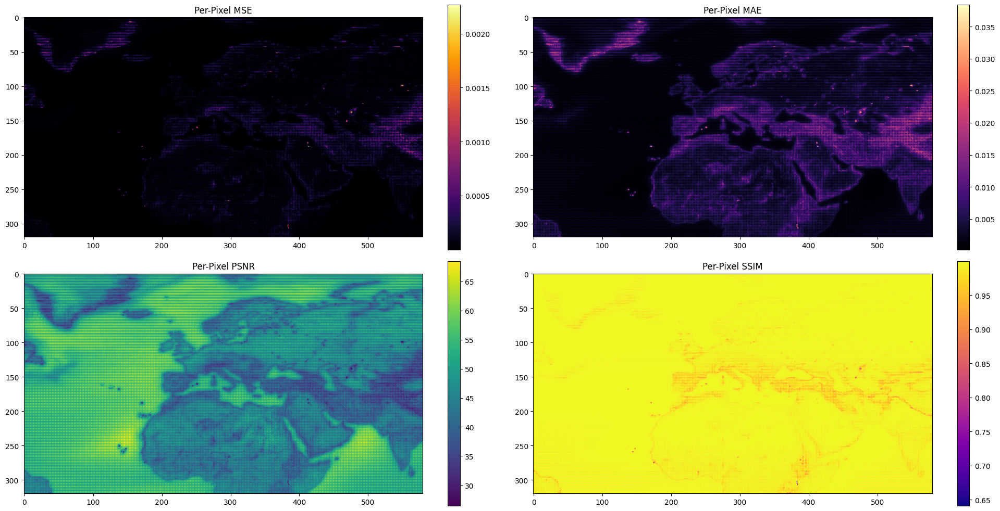

In [ ]:
# Plot results
plot_per_pixel_metrics(test_mse, test_mae, test_psnr, test_ssim)

In [ ]:
# Model 2 results
m2_mse = test_mse.reshape(-1)
m2_mae = test_mae.reshape(-1)
m2_psnr = test_psnr.reshape(-1)
m2_ssim = test_ssim.reshape(-1)


In [ ]:
import pandas as pd
import numpy as np

df = pd.DataFrame({
    "Value": np.concatenate([
        m1_mse, m2_mse, b_mse,
        m1_mae, m2_mae, b_mae,
        m1_psnr, m2_psnr, b_psnr,
        m1_ssim, m2_ssim, b_ssim
    ]),
    "Metric": (["MSE"] * len(m1_mse) + ["MSE"] * len(m2_mse) + ["MSE"] * len(b_mse) +
               ["MAE"] * len(m1_mae) + ["MAE"] * len(m2_mae) + ["MAE"] * len(b_mae) +
               ["PSNR"] * len(m1_psnr) + ["PSNR"] * len(m2_psnr) + ["PSNR"] * len(b_psnr) +
               ["SSIM"] * len(m1_ssim) + ["SSIM"] * len(m2_ssim) + ["SSIM"] * len(b_ssim)),
    "Model": (["No DEM"] * len(m1_mse) + ["DEM-Augmented"] * len(m2_mse) + ["Baseline"] * len(b_mse) +
              ["No DEM"] * len(m1_mae) + ["DEM-Augmented"] * len(m2_mae) + ["Baseline"] * len(b_mae) +
              ["No DEM"] * len(m1_psnr) + ["DEM-Augmented"] * len(m2_psnr) + ["Baseline"] * len(b_psnr) +
              ["No DEM"] * len(m1_ssim) + ["DEM-Augmented"] * len(m2_ssim) + ["Baseline"] * len(b_ssim))
})


Mean Per-Pixel Degrees MAE: 0.22728626
Max Degrees MAE: 2.4681067
Min Degrees MAE: 0.016009005


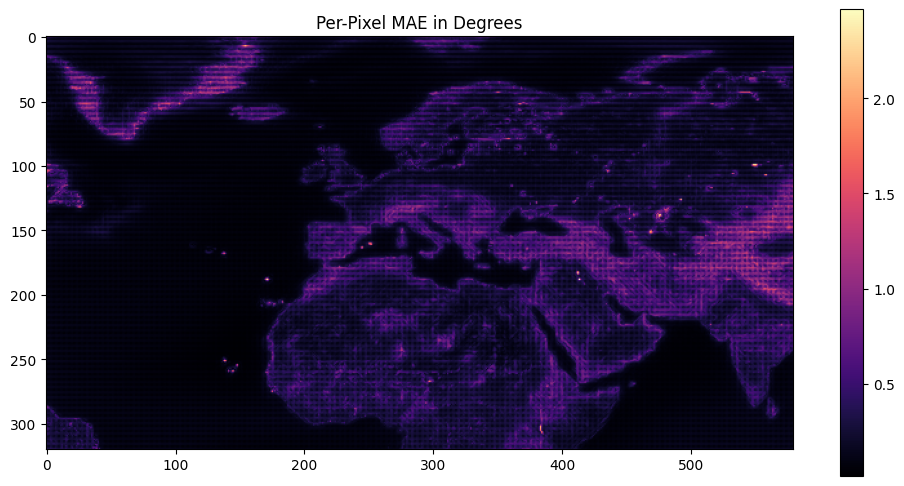

In [ ]:
degrees_mae_dem = denormalize_mae(test_mae, global_Std)
print("Mean Per-Pixel Degrees MAE:", np.mean(degrees_mae_dem))
print("Max Degrees MAE:", degrees_mae_dem.max())
print("Min Degrees MAE:", degrees_mae_dem.min())
plot_degrees_mae(degrees_mae_dem)

In [ ]:
print("Mean Land-Pixels Degrees MAE:", mean_with_land_mask(degrees_mae_dem, '0_25'))
print("Mean Land-Pixels MAE:", mean_with_land_mask(test_mae, '0_25'))

Mean Land-Pixels Degrees MAE: 0.34325767
Mean Land-Pixels MAE: 0.0053419657


In [ ]:
print("Mean Coastline-Pixels Degrees MAE:", mean_with_coastline_mask(degrees_mae_dem, '0_25'))
print("Mean Costline-Pixels MAE:", mean_with_coastline_mask(test_mae, '0_25'))

Mean Coastline-Pixels Degrees MAE: 0.46285486
Mean Costline-Pixels MAE: 0.0072032036


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

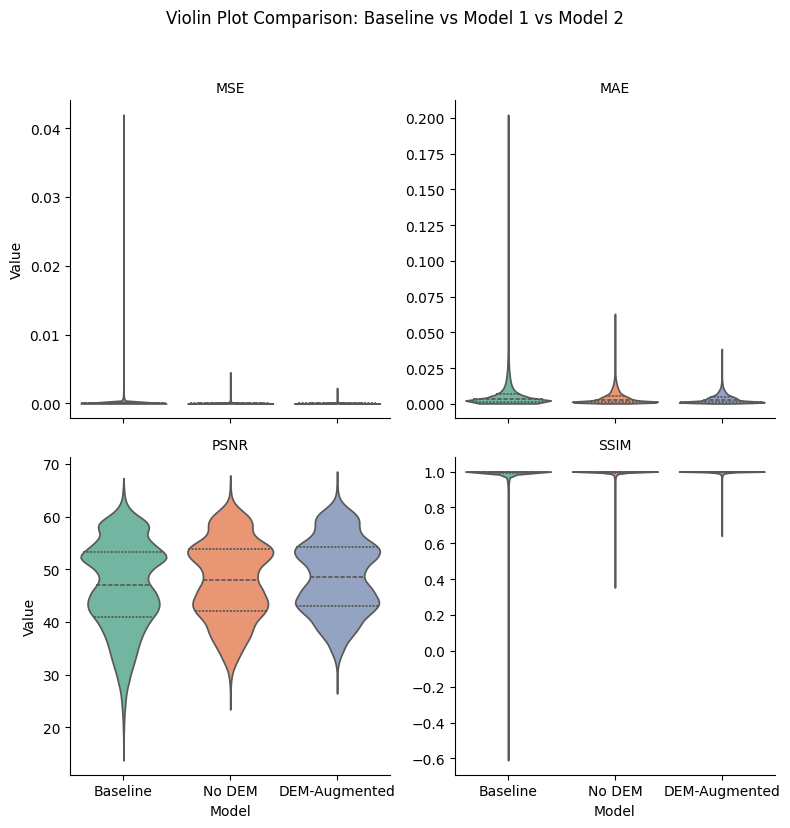

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define model order
model_order = ["Baseline", "No DEM", "DEM-Augmented"]

# Plot with FacetGrid
g = sns.FacetGrid(df, col="Metric", col_wrap=2, height=4, sharey=False)

# Add violin plots with specific model order
g.map_dataframe(
    sns.violinplot,
    x="Model",
    y="Value",
    order=model_order,
    palette="Set2",
    cut=0,
    inner="quartile"
)

# Set titles and layout
g.set_titles(col_template="{col_name}")
g.fig.suptitle("Violin Plot Comparison: Baseline vs Model 1 vs Model 2", y=1.03)
plt.tight_layout()
plt.show()


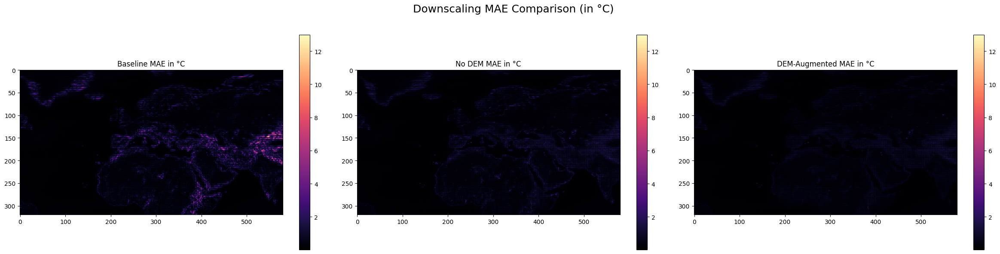

In [ ]:
import matplotlib.pyplot as plt

# Plot the heatmaps
fig, axes = plt.subplots(1, 3, figsize=(24, 6))
fig.suptitle('Downscaling MAE Comparison (in °C)', fontsize=18)

# Determine shared color scale across all three maps
vmin = min(bicubic_degrees_mae.min(), degrees_mae_2steps.min(), degrees_mae_dem.min())
vmax = max(bicubic_degrees_mae.max(), degrees_mae_2steps.max(), degrees_mae_dem.max())

# 1. Baseline
im0 = axes[0].imshow(bicubic_degrees_mae, cmap='magma', vmin=vmin, vmax=vmax)
axes[0].set_title("Baseline MAE in °C")
plt.colorbar(im0, ax=axes[0])

# 2. No DEM (2-step)
im1 = axes[1].imshow(degrees_mae_2steps, cmap='magma', vmin=vmin, vmax=vmax)
axes[1].set_title("No DEM MAE in °C")
plt.colorbar(im1, ax=axes[1])

# 3. DEM-Augmented
im2 = axes[2].imshow(degrees_mae_dem, cmap='magma', vmin=vmin, vmax=vmax)
axes[2].set_title("DEM-Augmented MAE in °C")
plt.colorbar(im2, ax=axes[2])

# Final layout tweaks
plt.tight_layout(rect=[0, 0, 1, 0.95])  # leaves space for the suptitle
plt.show()

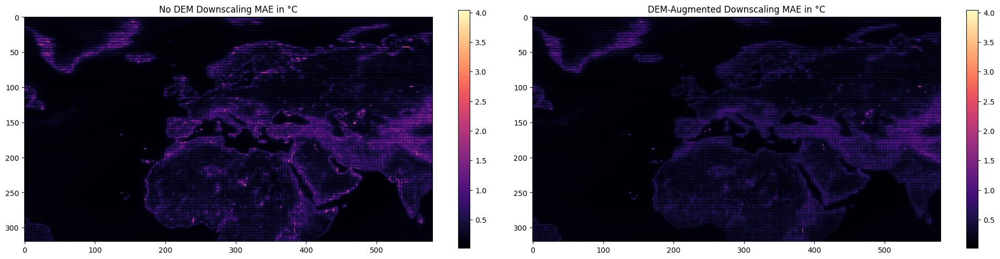

In [ ]:
import matplotlib.pyplot as plt

# Plot the heatmaps
fig, axes = plt.subplots(1, 2, figsize=(20, 5))
fig.suptitle('', fontsize=20)

vmin = min(degrees_mae_2steps.min(), degrees_mae_dem.min())
vmax = max(degrees_mae_2steps.max(), degrees_mae_dem.max())

im1 = axes[0].imshow(degrees_mae_2steps, cmap='magma', vmin=vmin, vmax=vmax)
axes[0].set_title("No DEM Downscaling MAE in °C")
plt.colorbar(im1, ax=axes[0])

im2 = axes[1].imshow(degrees_mae_dem, cmap='magma', vmin=vmin, vmax=vmax)
axes[1].set_title("DEM-Augmented Downscaling MAE in °C")
plt.colorbar(im2, ax=axes[1])

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Flatten the MAE maps
mae_baseline = bicubic_degrees_mae.flatten()
mae_2steps = degrees_mae_2steps.flatten()
mae_dem = degrees_mae_dem.flatten()

# Combine into a DataFrame
df_mae = pd.DataFrame({
    "MAE (°C)": np.concatenate([mae_baseline, mae_2steps, mae_dem]),
    "Method": (["Baseline"] * len(mae_baseline) +
               ["No DEM"] * len(mae_2steps) +
               ["DEM-Augmented"] * len(mae_dem))
})

/tmp/ipython-input-34-2112139272.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Method", y="MAE (°C)", data=df_mae, order=["Baseline", "No DEM", "DEM-Augmented"], palette="Set2", inner="quartile", cut=0)


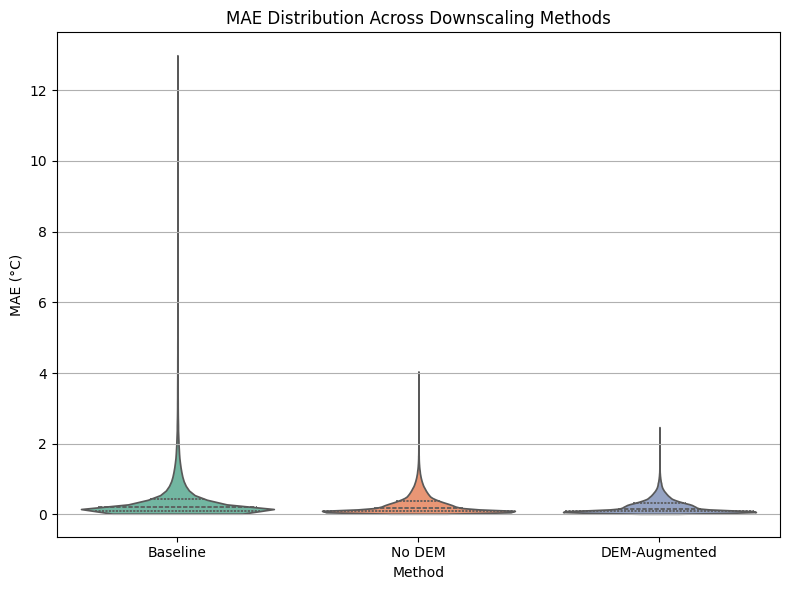

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(x="Method", y="MAE (°C)", data=df_mae, order=["Baseline", "No DEM", "DEM-Augmented"], palette="Set2", inner="quartile", cut=0)

plt.title("MAE Distribution Across Downscaling Methods")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


# **Simple vs Dem Downscaling**

In [ ]:
medium_res_output = edsr_model_step1.predict(np.expand_dims(testX[1], axis=0))
high_res_output_simple = edsr_model_step2.predict(medium_res_output)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


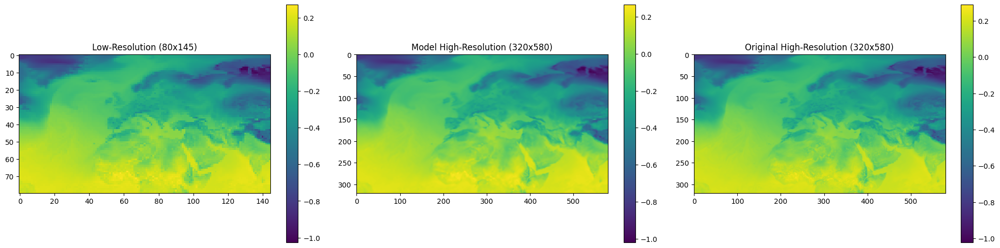

In [ ]:
plot_to_compare(testX[1], testY[1],  np.squeeze(high_res_output_simple), 'viridis')

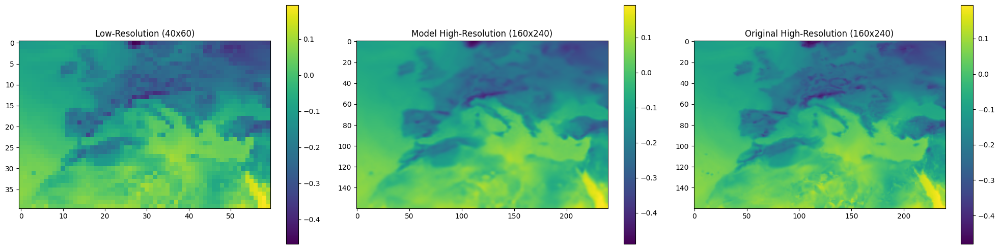

In [ ]:
plot_to_compare(testX[1][20:60, 40:100], testY[1][80:240, 160:400],  np.squeeze(high_res_output_simple)[80:240, 160:400], 'viridis')

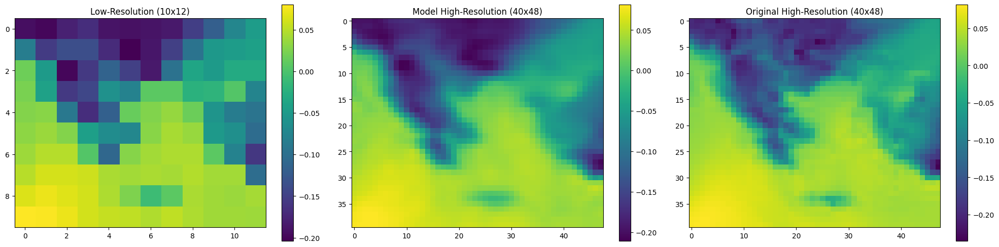

In [ ]:
plot_to_compare(testX[1][36:46, 78:90], testY[1][144:184, 312:360],  np.squeeze(high_res_output_simple)[144:184, 312:360], 'viridis')

In [ ]:
medium_res_output = dem_edsr_model_step1.predict(np.expand_dims(testX[1], axis=0))
high_res_output_dem = dem_edsr_model_step2.predict(medium_res_output)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


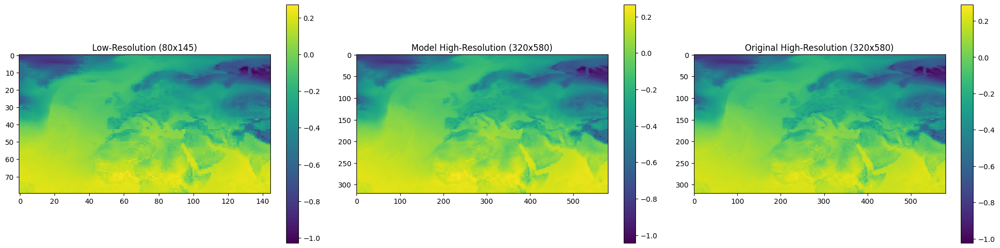

In [ ]:
plot_to_compare(testX[1], testY[1],  np.squeeze(high_res_output_dem), 'viridis')

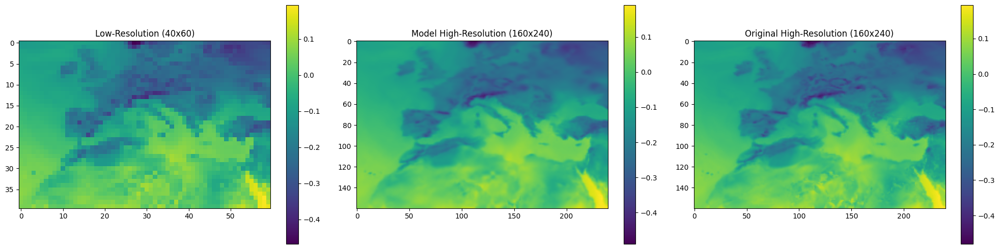

In [ ]:
plot_to_compare(testX[1][20:60, 40:100], testY[1][80:240, 160:400],  np.squeeze(high_res_output_dem)[80:240, 160:400], 'viridis')

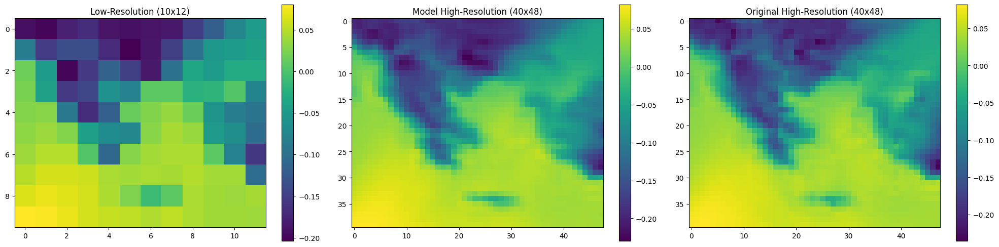

In [ ]:
plot_to_compare(testX[1][36:46, 78:90], testY[1][144:184, 312:360],  np.squeeze(high_res_output_dem)[144:184, 312:360], 'viridis')

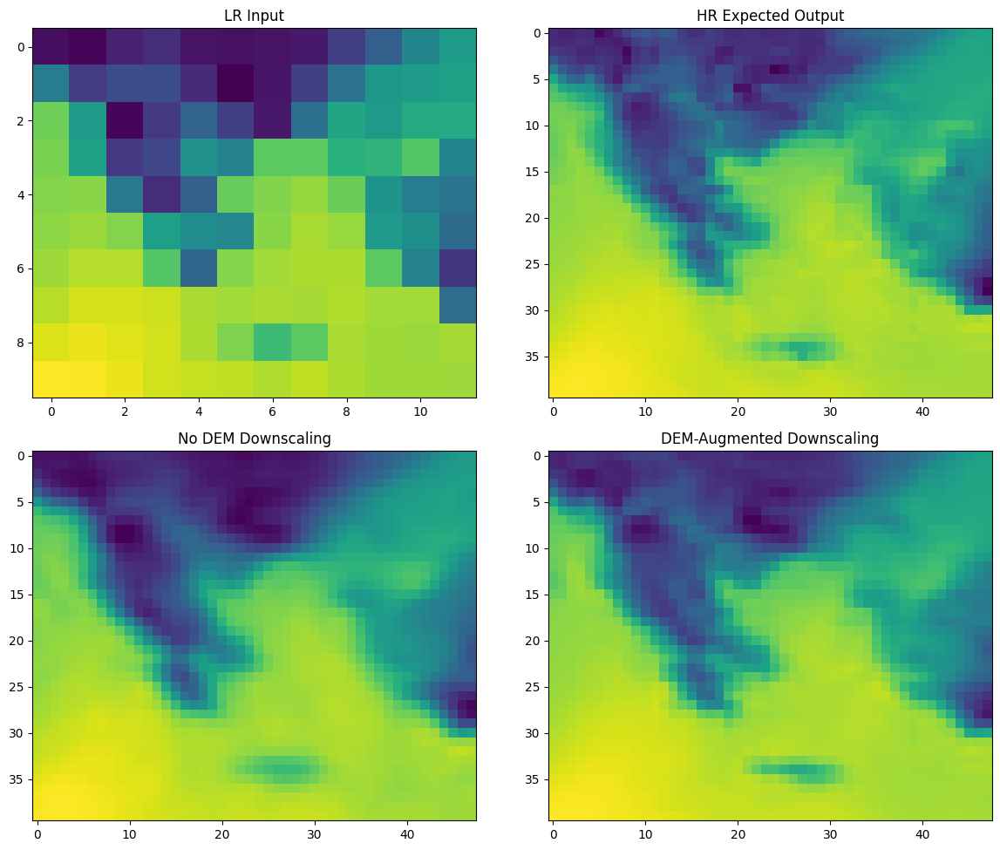

In [ ]:
import matplotlib.pyplot as plt

# Plot the heatmaps
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('', fontsize=20)


im1 = axes[0, 0].imshow(testX[1][36:46, 78:90], cmap='viridis')
axes[0, 0].set_title("LR Input")

im2 = axes[0, 1].imshow(testY[1][144:184, 312:360], cmap='viridis')
axes[0, 1].set_title("HR Expected Output")

im3 = axes[1, 0].imshow(np.squeeze(high_res_output_simple)[144:184, 312:360], cmap='viridis')
axes[1, 0].set_title("No DEM Downscaling")

im4 = axes[1, 1].imshow(np.squeeze(high_res_output_dem)[144:184, 312:360], cmap='viridis')
axes[1, 1].set_title("DEM-Augmented Downscaling")

# Adjust layout
plt.tight_layout()
plt.show()

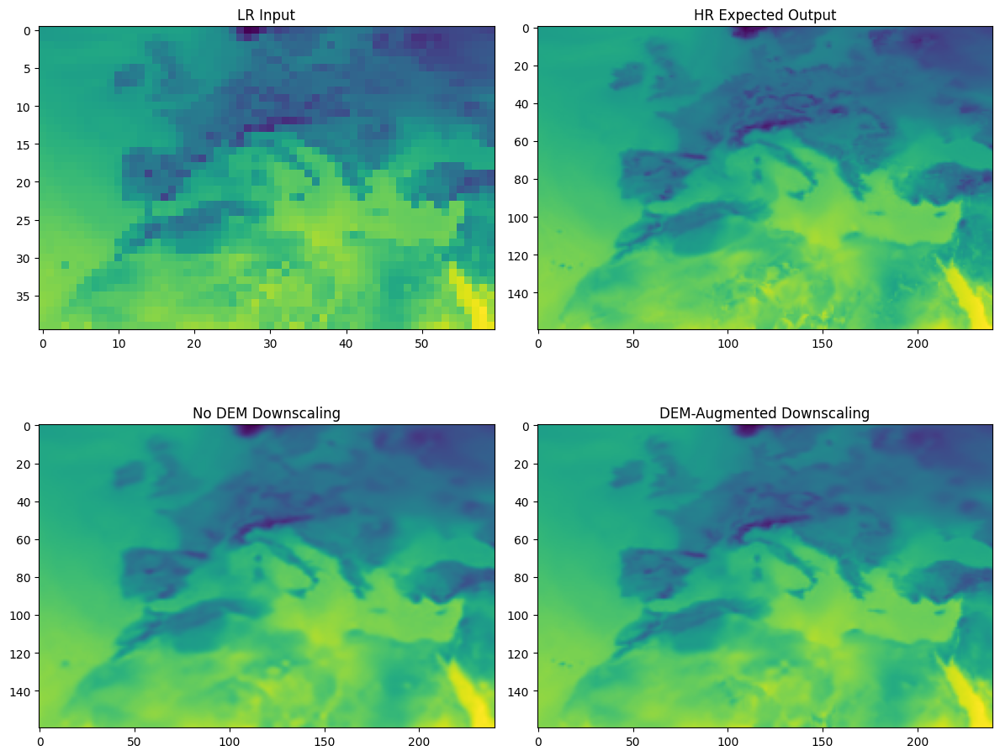

In [ ]:
import matplotlib.pyplot as plt

# Plot the heatmaps
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('', fontsize=20)


im1 = axes[0, 0].imshow(testX[1][20:60, 40:100], cmap='viridis')
axes[0, 0].set_title("LR Input")

im2 = axes[0, 1].imshow(testY[1][80:240, 160:400], cmap='viridis')
axes[0, 1].set_title("HR Expected Output")

im3 = axes[1, 0].imshow(np.squeeze(high_res_output_simple)[80:240, 160:400], cmap='viridis')
axes[1, 0].set_title("No DEM Downscaling")

im4 = axes[1, 1].imshow(np.squeeze(high_res_output_dem)[80:240, 160:400], cmap='viridis')
axes[1, 1].set_title("DEM-Augmented Downscaling")

# Adjust layout
plt.tight_layout()
plt.show()